# ETUDE FREQUENTATION DES PARKINGS ET STATIONS DE VELO DE MONTPELLIER

### Dossier réalisé par : Mathis Pelegrin et Lorenzo Coppier

### SOMMAIRE

[Méthodologie](#méthodologie)

[Localisation des parkings et stations](#loc_parking)

[Traitement des données](#trait_donn)

[Analyse de la fréquentation des parkings et stations](#analyse)

[Cartographie des Taux d'Occupation](#carto_occ)

[Conclusion](#conclusion)

[Requêtes parkings](#requ_pkg)

[Requêtes bases Velo](#requ_velo)

[statitiques détaillées Parkings](#stats_pkg)

[statitiques détaillées Vélos](#stats_velo)    

## Méthodologie : <a class="anchor" id="méthodologie"></a>

### Plan méthodologique pour répondre à la demande de la mairie de Montpellier sur l'utilisation des parkings voitures et vélos

### Problématique :
Vous et votre binôme avez été mandatés par la mairie de Montpellier afin d’étudier l’utilisation des parkings de la ville. Plusieurs aspects intéressent Monsieur le Maire, aussi fait-il appel à votre sagacité concernant les points suivants de sa politique de développement de la ville :
⊲ Le taux d’occupation des parkings voiture 
⊲ Le taux d’occupation des parkings vélos 
⊲ Le bon fonctionnement du relais voiture / vélo.

### Traitements à réaliser :
1.	Collecte des données :
•	Récupération des données historiques d'occupation des parkings voitures et vélos sur l'année 2023, toutes les 5 minutes, sur le site open data de la mairie de Montpellier
•	Récupération des données d'occupation en temps réel des mêmes parkings

2.	Préparation des données :
•	Nettoyage et vérification de la qualité des données collectées
•	Formatage dans des tables structurées pour analyse (dates, horaires, taux d'occupation...)

3.	Analyses descriptives :
•	Calcul des taux d'occupation moyens pour chaque parking, toutes les 5 minutes, heures, jours, mois
•	Identification des périodes de saturation (taux > 90%)
•	Pour les parkings seule la saturation pose problème, pour les vélos on aura : saturation (impossibilité ou difficultés 
    de déposer un vélo), mais aussi pénurie (absence de vélo à emprunter = 0 vélo dispo)
•	Comparaison des évolutions selon les types de parkings et leur localisation

4.	Analyses explicatives
•	Corrélation entre taux d'occupation voitures et vélos selon les lieux et périodes
•	Évolution des usages le WE / semaine

5.	Synthèse et recommandations
•	Présentation de la méthodologie
•	Rédaction d'une synthèse des résultats sous Jupiter Notebook
•	Recommandations pour dimensionnement des parkings
•	Mise à disposition sur Jupiter Notebook
•	Stockage des données, codes et synthèse sur GitHub


## Localisation des parkings et stations : <a class="anchor" id="loc_parking"></a>

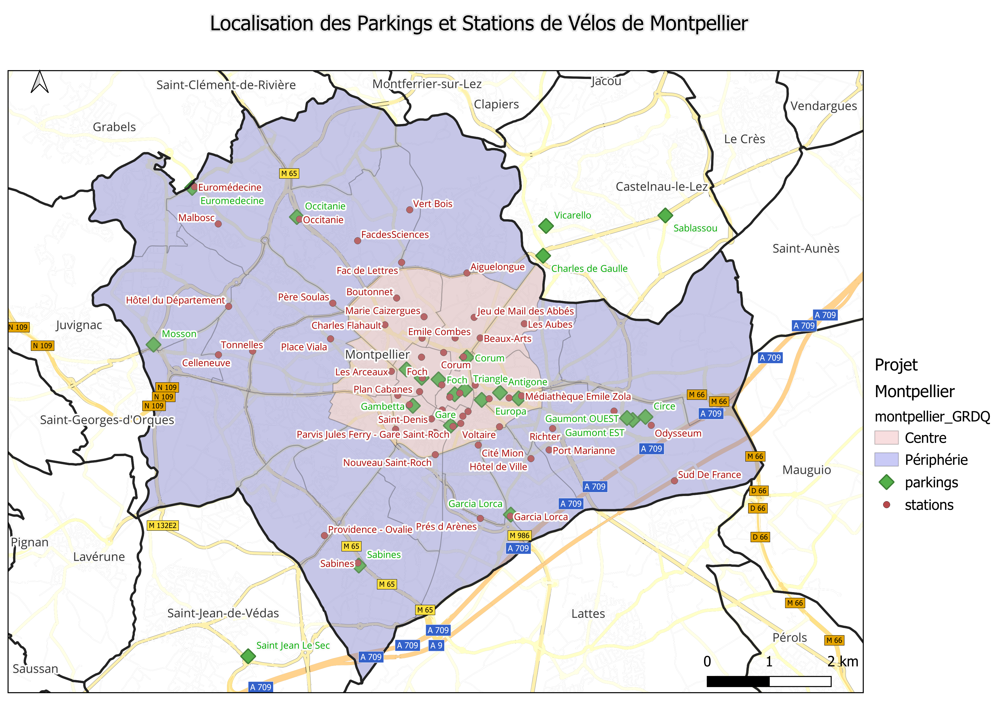

## Traitements données Parking  : <a class="anchor" id="trait_donn"></a> 

### 1.	Collecte des données :

#### Sources : 
Les donnée sont disponibles sur le site : Open Data Montpellier Méditerranée Métropole
Plusieurs API sont disponibles : 
##### •	Récupération des données historiques d'occupation des parkings voitures et vélos sur l'année 2023, toutes les 5 minutes, sur le site open data de la mairie de Montpellier :

![image.png](attachment:image.png)
![image-2.png](attachment:image-2.png)
 
##### •	Récupération des données d'occupation en temps réel des mêmes parkings :
![image-3.png](attachment:image-3.png)
![image-4.png](attachment:image-4.png)


Compte tenu de l’objectif poursuivi : Analyse des taux d’occupation, les bases qui nous intéressent sont les données d’historique.
Les données en temps réels n’apportent pas d’information pertinente (en dehors de la valeur à un instant ‘t’) sur le taux d’occupation ou la pénurie des vélos au sein de la métropole de Montpellier.

Nous avons décidé de récupérer tous les ‘data’ des Parkings et Parcs à Vélo présents dans les bases de données de ’Open Data Montpellier Méditerranée Métropole’ pour l’année 2023 de façon à avoir une année complète.
Les bases de données ne disposent pas d’historique en deçà de 2023 (First recorded date at 2023-01-04).
On ne pourra donc pas établir des statistiques sur plusieurs années, ni faire une analyse des séries temporelles (étude saisonnalité et tendances).
 

#### bases Parkings : 
Les bases de données concernent 23 parkings, dont 19 sur la commune de Montpellier et 4 localisés sur les communes limitrophes (St Jean de Vedas (1) et Castelnau le Lez (3).
Sur les 23 parkings, 2 ne contiennent aucun historique sur la période étudiée (année 2023) et ne peuvent être traités : 
-	Gaumont Est 
-	Gaumont Ouest


#### bases Vélos : 
Les bases de données concernent 57 parcs à vélo, dont 56 sur la commune de Montpellier et 1 localisé sur une autre commune (Pérols).

#### Format des fichiers :
Les données stockées sont au format JSON.
JSON est un format qui permet de stocker des informations structurées :
-	Les données sont présentées sous forme de paires clé/valeur.
-	':' est placé entre chaque clé et chaque valeur
-	Les éléments de données sont séparés par des virgules.
-	Les crochets {} désignent les objets.
-	Les crochets [] désignent des tableaux.
-	{“key”:“value”,“key”:“value”,“key”:“value”.}

#### Structure des fichiers :
Chaque parking voiture ou parc vélo dispose d’un code unique, qui se présente de la façon suivante : « urn:ngsi-ld:parking:001 »
Chaque fichier parking contient les champs suivants : 
-	attrName, str, 19 (nom de variable : availableSpotNumber, nombre de places disponibles)
-	entityId, str, 23 (code parking)
-	entityType, str, 16 (type : OffStreetParking)
-	index, list, 8526 (timestamp)
-	values, list, 8526 (nbr de places disponibles)
Timestamps constitue l’horodatage de la donnée (values), cette variable permet d’identifier la date et l’heure, elle se présente de la façon suivante : « 2023-01-04T10:50:51.000+00:00 »

 

###  2. Extraction des données : 
Collecte des métadonnées (description des variables, unités, période couverte, etc) :
L’extraction et le traitement des données a été réalisée à partir de programmes spécifiques développés sous Python. 
#### Base Parking : 
•	nombre d'enregistrements attendus : 365 jours x 24 heures x 60 mn / 5 mn (temps de réponse entre 2 enregistrements) = 105.120 enregistrements
•	les limites d'extraction sont de 10.000 lignes par extraction, il faut donc au moins 11 extractions pour récupérer une base complète
•	le plus simple c'est de générer une boucle avec une extraction par mois, avec un cumul dans une même variable (par data.extend())
•	début historique : 2023-01-04T10:50 (toutes les données commencent le 4 janvier à 10h50)

#### Base Parc Velo : 
•	nombre d'enregistrements attendus : 365 jours x 24 heures x 60 mn / 1 mn (temps de réponse entre 2 enregistrements) = 525.600 enregistrements
•	les limites d'extraction sont de 10.000 lignes par extraction, il faut donc au moins 53 extractions pour récupérer une base complète
•	le plus simple c'est de générer une boucle avec une extraction par jour, avec un cumul dans une même variable (par data.extend())
•	début historique : 2023-01-04T10:50 (toutes les données commencent le 4 janvier à 10h50)

•	extraction des données de l’API : 
        url = "https://portail-api-data.montpellier3m.fr/parking_timeseries/"+parking_id+"/attrs/availableSpotNumber"
        params = {
          "fromDate": from_date,
          "toDate": to_date
        }
        response = requests.get(url, params=params)
        data = response.json()

•	cumul dans une base totale pour chaque parking: 
    # Ajoutez les nouvelles valeurs des listes.
    data_cumul["index"].extend(data["index"])
    data_cumul["values"].extend(data["values"])
    
 
### 3.	Transformation des Données : 

#### 3.1	 Transformation des JSON en Dataframe : 
Le format JSON n’est pas vraiment adapté pour effectuer des calculs statistiques ou même contrôler la qualité des données. 
On a privilégié le traitement sous forme de DataFrame de la bibliothèque Pandas.
Ce qui permet également une continuité des traitements informatiques sous Python (comme pour l’extraction des données).
Le code Python est par ailleurs plus facilement réutilisable en vue de futures mises à jour.

Le passage du JSON au DataFrame s’effectue simplement en combinant les 2 listes : timestamp et value dans un dictionnaire puis en passant le dictionnaire au DataFrame : 
        pkg_data = json.load(parking_file)
    timestamps = np.array(pkg_data["index"])
    values = np.array(pkg_data["values"])
    data = {"timestamp": timestamps, "values": values}
    dataframe = pd.DataFrame(data)

#### 3.2	Vérification de la qualité des données :
•	Valeurs manquantes ou aberrantes : les disponibilités ne peuvent être > capacité, création d’un filtre : 
dataframe = dataframe[(dataframe['values'] <= capacite_max)]
Les fichiers par parking contiennent un nombre variable de jours (en moyenne 255 jours).
Si les bases de données ne sont pas complètes, on dispose de suffisamment de données pour pouvoir 

•	Types et formats des variables : pour traiter plus facilement les données, celles-ci après avoir été chargées sont transférées du format JSON au format « dataframe » de la librairie Pandas sous Python.
•	Cohérence des dates/horaires : le timstamp permet une codification cohérente des dates et des heures. Les délais entre 2 enregistrements et d’environ 5 mn pour les parkings et d’une minute pour les stations de vélos.

#### 3.3	Structure des données :
•	availableSpotNumber : Capacité maximum des parkings (extrait de la liste des parkings et de la liste des stations de vélo),
•	Timestamp : contient toutes les informations de date et heure
Ex : « 2023-02-23T16:11:29.000+00:00 »
    # Reformate le timestamp au format pandas (supprime notamment le 'T') :
    dataframe["timestamp"] = pd.to_datetime(dataframe["timestamp"])

•	availableSpotNumber:  nombre de places disponibles
ex.         260.0


####  3.4	Transformation des données :
•	Extraction des variables temporelles : nous avons choisi de traiter les données selon : 
o	Mois : analyse de la variation mensuelle sur les 12 mois de l’année 2023 
o	Jour :  analyse de la variation selon le jour de semaine, du lundi au dimanche 
o	Heure : analyse de la variation sur les 24 heures de la journée

•	Calcul de nouvelles variables dérivées : 
o	Nb_data : nombre de données / temps (heure, jour, mois)
o	min : nombre minimum de places disponibles / temps (heure, jour, mois)
o	max : nombre maximum de places disponibles / temps (heure, jour, mois)
o	mean : nombre moyen de places disponibles / temps (heure, jour, mois)
o	std : écart-type du nombre de places disponibles / temps (heure, jour, mois)
o	sum : nombre total de places disponibles / temps (heure, jour, mois)
o	Q1 : 1er quartile (25 % ) de la distrib. du nombre de places disponibles / temps (heure, jour, mois)
o	median : 2ème quartile ou médian (50 % ) de la distrib. du nombre de places disponibles / temps (heure, jour, mois)
o	Q3 : 3ème quartile (75 % ) de la distrib. du nombre de places disponibles / temps (heure, jour, mois)
o	Taux de disponibilité : nb de places disponibles / capacité maximum * 100
o	Taux d’occupation : 100 - Taux de disponibilité 
o	Penurie : nbr de périodes de temps ou le parking est saturation (places disponibles = 0),
o	Taux_penurie : penurie / nb data *100 (soit % de temps ou le parking est à saturation).

•	Traitements Python pour la création des variables : 
    # Calcul des statistiques :
    dataF_comp["nb_data"] = dataframe.groupby("hour")["values"].count()
    dataF_comp["min"] = dataframe.groupby("hour")["values"].min()
    dataF_comp["max"] = dataframe.groupby("hour")["values"].max()
    dataF_comp["mean"] = round(dataframe.groupby("hour")["values"].mean(),1)
    dataF_comp["std"] = round(dataframe.groupby("hour")["values"].std(),1)
    dataF_comp["sum"] = dataframe.groupby("hour")["values"].sum()
    dataF_comp["Q1"] = dataframe.groupby("hour")["values"].quantile(0.25) 
    dataF_comp["median"] = dataframe.groupby("hour")["values"].median()
    dataF_comp["Q3"] = dataframe.groupby("hour")["values"].quantile(0.75)

    # Calcul du taux d'occupation dans le dataframe source :
    dataframe["taux_dispo"] = (dataframe["values"] / capacite_max)* 100  
    # Aggregation dans le dataframe traité
    dataF_comp["taux_dispo"] = round(dataframe.groupby("hour")[["taux_dispo"]].agg({
    "taux_dispo": "mean"}),2)
    dataF_comp["taux_occ"] = 100- dataF_comp["taux_dispo"] 

    # Compter le nb de valeurs = 0  (Penurie) :
    dataF_comp["penurie"] = dataframe.groupby("hour")["penurie"].sum()    
    # Calcul du taux de pénurie dans le dataframe source
    dataF_comp["taux_penurie"] = (dataF_comp["penurie"] / dataF_comp["nb_data"])* 10

#### 3.5 Organisation des données :

On génère 1 fichier par niveau de temps pour chaque parking, soit 3 fichiers data par parking.

Ex. data par jour :
 
 ![image-5.png](attachment:image-5.png)
 

On a également généré une série de graphiques pour parking ou station de vélo et selon les 3 niveaux de temps : 
•	Graphique min, moy, max
•	Graphique médiane + intervalle interquartile 
•	Graphique Taux de disponibilité
•	Graphique Taux d’occupation
•	Graphique Taux de pénurie 


 
###  4.	Comparaison entre parkings :

Pour pouvoir comparer les parkings entre eux selon leur niveau d’occupation et la saturation et rechercher des comportements homogènes, on a réalisé une compilation des différents parkings et stations de vélos.

####  4.1	Compilation des données :

Chaque ligne du nouveau DataFrame correspond à un parking ou une station de vélos.
A partir des données par jour de semaine, on a distingué 2 périodes :  Jour de semaine / Week-end.
A partir des données par heure, on a distingué 3 périodes :  nuit / jour / soir.
A partir des données par mois, on a distingué 2 périodes :  Été / autres saisons.
On a également considéré la localisation géographique du parking : Centre de Montpellier/Périphérie

Exemple du code permettant de compiler les taux d’occupation moyen en semaine et en week-end pour les parkings :
    sem_occ = round(bdd['taux_occ'].iloc[0:5].mean(),2)        
    we_occ = round(bdd['taux_occ'].iloc[6:7].mean(),2)        
    Tx_penurie = round(bdd['taux_penurie'].mean(),2)
    
    #création des nouvelles colonnes du DF : 
    if ind == 0:
       
        d_G['sem_occ'] = np.nan
        d_G['we_occ'] = np.nan
        d_G['tx_penurie'] = np.nan
        
    # remplissage
    d_G.loc[ind,'sem_occ'] = sem_occ
    d_G.loc[ind,'we_occ'] = we_occ
    d_G.loc[ind,'tx_penurie'] = Tx_penurie

La base résultant de ce traitement se présente sous la forme suivante pour les parkings : 

![image-6.png](attachment:image-6.png)




#### 4.2	Requêtes sur la base compilée : 

Afin de faciliter l’analyse dans le cadre de cette étude et de son exploitation éventuelle par le commanditaire de l’étude, on a généré un système de requête assez simple à partir du DataFrame compilé. 
#### Query :
Il suffit d’écrire la condition ou filtre souhaité dans la variable ‘Query’ comme ci-dessous : 
Query =  'we_occ > 50 and tx_penurie>0'
Query =  'we_occ > sem_occ * 0.9'
Query =  'zone == "Centre"'

#### Puis d’exécuter et afficher les résultats : 
print(d_V.query(Query))   
Il est également possible d’effectuer un nouveau calcul sur la base des éléments correspondant au Query :

####  nouveaux calculs sur la base : 
param='we_occ'
print(d_V.query(Query)[param].mean())



## Analyse : <a class="anchor" id="analyse"></a>

### Analyse des parkings : 
Sur l’ensemble des parkings étudiés, nous avons identifier les parkings suivants qui présentent des niveaux de pénuries (manque de places disponibles :

|Nom | tx_occ | tx_pénurie |zone|
|:-| -: | -: |---- |
|004-Corum|   24.75   |     0.13  |    Centre|
|006-Foch |  67.26 |       0.01 |     Centre|
|009-Triangle|   46.94 |       0.07 |     Centre|
|010-Pitot|  40.72 |       0.12 |     Centre |
|014-Sabines  | 34.37 |       0.04 | Périphérie|

Toutefois ces taux de pénurie sont assez faible (<0.15 % du temps total).
Sur ces 5 parkings, 4 sont situés au centre de la commune. Un seul parking « 014-Sabines » est situé en Périphérie.
En plus des parkings qui présentent des pénuries de places, on a également identifié 2 parkings dont le taux d’occupation moyen des places est relativement élevé (tx_occup >  50 %). :

|Nom | tx_occ | tx_pénurie |zone|
|:-| -: | -: |---- |
|006-Foch|   67.26  |      0.01|  Centre|
|002-Arc de Triomphe  | 72.63    |    0.00|  Centre|

Ces 2 parkings sont situés au centre de la commune et présentent un taux d’occupation moyen de 69.94 % (taux d’occupation de 36,27 % sur la moyenne des parkings sur la commune).

Certains parkings, situés majoritairement au centre de la commune, présentent une forte activité le week-end (sans toutefois dépasser la fréquentation en semaine) 
|Nom|  tx_occ|  we_occ|  sem_occ| zone|
|:-| -: | -: | -: |---- |
|001-Antigone |  49.56|   46.36|    50.23  |    Centre|
004-Corum |  24.75|   19.48 |   23.86 |     Centre|
|006-Foch |  67.26 |  57.06 |   68.33   |   Centre|
|007-Gambetta|  49.58 |  44.83  |  50.24  | Centre|
|008-Gare |  48.76 |  41.70 |   50.69  |  Centre|
|016-Saint Jean Le Sec | 26.29 |  24.01 |   26.73 | Périphérie|
|022-Charles de Gaulle |  37.79 |  31.94 |   39.75 | Périphérie|
|002-Arc de Triomphe |  72.63 |  63.82  |  74.01| Centre|

Le taux de fréquentation le Week-end est de 37,66 % en moyenne pour les parkings du centre, alors qu’ils ne sont que de 18,14 % pour les parkings de périphérie.
Ainsi ces derniers sont essentiellement utilisés en semaine par une population active (avec éventuellement la complémentarité avec les réseaux de transport en commune : tramway et bus). 

 
Plusieurs parkings présentent une activité soutenue qui s’étend sur l’ensemble des 24 h et notamment la nuit ( de 0 à 7 h).
Il s’agit des parkings suivants qui sont pour la plupart situés au centre : 
|Nom | tx_occ |soir_occ | jour_occ | nuit_occ| zone |
|:-| -: | -: | -: | -:|---- |
|001-Antigone |  49.56 |  48.49  |   51.75 |   47.80 | Centre|
|006-Foch |  67.26 | 78.32  |   70.47 |    56.15 |     Centre|
|007-Gambetta | 49.58 |51.68 | 51.52  |   46.38 | Centre|
|008-Gare | 48.76 | 51.09  | 54.17 | 40.70 | Centre|
|022-Charles de Gaulle | 37.79 | 34.93 | 43.30 |33.24 | Périphérie|
|002-Arc de Triomphe |72.63 | 77.08 | 76.86 | 65.19 | Centre|

Certains parkings du centre présentent même un taux d’occupation le soir (entre 18 et 23 h) supérieur au taux d’occupation en journée (8 – 17 h) : 

|nom | tx_occ | soir_occ| jour_occ | nuit_occ | zone|
|:-| -: | -: | -: | -:|---- |
|003-Comedie |  48.05 | 59.93 | 55.02 | 31.76 |Centre|
|004-Corum |  24.75 |36.88  | 26.87 |10.39 | Centre |
|006-Foch |  67.26 | 78.32 |70.47 |56.15 | Centre|
|007-Gambetta |  49.58 |51.68 | 51.52 | 46.38 | Centre|
|002-Arc de Triomphe |  72.63 | 77.08 | 76.86 | 65.19 | Centre|

Globalement on observe donc des différences importantes entre les parkings du centre, qui sont multi-usage avec une activité soutenue sur les périodes : soir/jour/nuit mais également : semaine et week-end.
Leur forte activité est également en lien avec les capacités de stationnement de surface plus limités au centre.
Les parkings de périphérie présentent des taux de fréquentation généralement plus faibles et fonctionnent majoritairement en semaine et en journée. 
Ils sont très probablement utilisés par des actifs qui déposent leur véhicule pour une longue période (journée de travail) et utilisent ensuite les transports en commun.

 
### Analyse des stations de vélos : 
Toutes les stations de vélos présentent des pénuries, dont 6 stations avec 20 % et + du temps total, en pénurie.
En dehors de la station de la gare Saint Roch, tous ces stations se situent en périphérie. Les taux d’occupation sont particulièrement élévés (75 % en moyenne pour ces stations).

|Nom | tx_occ | tx_pénurie |zone|
|:-| -: | -: |---- |
|034-Vert Bois |  83.36 | 34.40 |  Périphérie|
|037-FacdesSciences  | 68.30 | 20.36 | Périphérie|
|038-Fac de Lettres |  71.67 | 30.63 | Périphérie|
|048-Hôtel du Département |  73.78 | 22.23 | Périphérie|
|051-Pont de Lattes - Gare Saint-Roch |  81.91 | 22.55 | Centre|
|059-Sud De France |  71.07 | 24.44 | Périphérie|


Si l’on considère les stations les plus fortement équipées, on recense les 8 stations suivantes qui présentent des taux d’occupation >= 70 %, avec un taux d’occupation moyen de 75 %. Sur les 8 stations, 4 sont situés au centre de la commune et 4 en périphérie.
|Nom| tx_occ |zone|
|:-| -:|---- |
|023-Les Arceaux | 71.69 | Centre|
|034-Vert Bois |  83.36 | Périphérie|
|038-Fac de Lettres |  71.67 | Périphérie|
|048-Hôtel du Département  | 73.78 | Périphérie|
|051-Pont de Lattes - Gare Saint-Roch  | 81.91 | Centre|
|056-Albert 1er - Cathédrale | 70.25 | Centre|
|059-Sud De France |  71.07 | Périphérie|
|061-Jean de Beins |  72.37 | Centre|

Sur les 57 stations, 36 stations présentent une activité plus importante le week-end par rapport à la semaine (taux d’occupation WE > taux d’occupation semaine). Ces stations sont très largement situés dans la partie centre de la commune.
|Nom | we_occ |sem_occ| zone|
|:-| -: | -: |---- |
|001-Rue Jules Ferry - Gare Saint-Roch |  72.50  |  59.32  |    Centre|
|002-Comédie |  72.55|   54.28  |    Centre|
|005-Corum |  52.34 |   48.55  |    Centre|
|006-Place Albert 1er - St Charles |  71.71  |  64.61  |    Centre|
|007-Foch |  81.97  |  62.07  |    Centre|
|008-Halles Castellane |  81.51  |  63.47   |   Centre|
|009-Observatoire |  73.87 |   59.41    |  Centre|
|010-Rondelet  | 70.24  |  67.88  |    Centre|
|011-Plan Cabanes |  62.28 |   60.00  |    Centre|
|013-Emile Combes |  40.09|    34.04   |   Centre|
|015-Les Aubes  | 39.98  |  38.89    |  Centre|
|016-Antigone centre  | 65.41  |  53.54   |   Centre|
|017-Médiathèque Emile Zola |  63.40 |   54.50    |  Centre|
|018-Nombre d Or |  65.56 |   56.70 |     Centre|
|019-Louis Blanc |  61.41 |   51.35  |    Centre|
|020-Gambetta |  60.56 |   57.17 |     Centre|
|023-Les Arceaux |  75.46  |  71.58  |    Centre|
|025-Nouveau Saint-Roch |  59.33  |  57.09   |   Centre|
|026-Renouvier  | 61.62 |   57.24  |    Centre|
|028-Saint-Denis  | 63.75   | 62.78  |    Centre|
|031-Voltaire  | 39.55 |   36.56  |    Centre|
|032-Prés d Arènes |  44.83 |   41.71|  Périphérie|
|034-Vert Bois  | 89.52  |  82.33 | Périphérie|
|038-Fac de Lettres |  73.14 |   71.57 | Périphérie|
|040-Jeu de Mail des Abbés |  45.67  |  40.29   |   Centre|
|044-Celleneuve |  70.69|   64.11 | Périphérie|
|048-Hôtel du Département  | 75.67   | 73.59|  Périphérie|
|049-Tonnelles   |73.16  |  68.46  |Périphérie|
|050-Parvis Jules Ferry - Gare Saint-Roch|  51.61  |  46.13 |     Centre|
|051-Pont de Lattes - Gare Saint-Roch|   85.74|   81.03  |    Centre|
|053-Deux Ponts - Gare Saint-Roch |  55.30   | 55.04  |    Centre|
|056-Albert 1er - Cathédrale |  81.34 |  67.95  |    Centre|
|057-Saint-Guilhem - Courreau |  72.01 |   63.34 |     Centre|
|059-Sud De France |  72.9|2    71.22 | Périphérie|
|061-Jean de Beins |  74.85 |   71.40  |   Centre|

Certaines stations présentent un taux d’occupation supérieur le soir comparativement à la journée, il s’agit des 27 stations suivantes, 8 au centre et 19 en périphérie, le taux d’occupation moyen pour ces  stations est de 59 %  : 
|Nom| soir_occ| jour_occ | zone|
|:-| -: | -: |---- |
|002-Comédie  |   53.78   |  51.13  |    Centre|
|007-Foch   |  65.92  |   54.63    |  Centre|
|008-Halles Castellane  |   64.59  |   57.62    |  Centre|
|012-Boutonnet   |  61.90   |  47.74    |  Centre|
|014-Beaux-Arts  |   47.13   |  46.82   |   Centre|
|023-Les Arceaux  |   71.97 |    71.89  |    Centre|
|024-Cité Mion |    56.52 |    55.84 | Périphérie|
|029-Richter  |   45.65  |   43.89  |Périphérie|
|030-Charles Flahault  |   50.00  |   49.13   |   Centre|
|034-Vert Bois |    89.44 |    78.81 | Périphérie|
|035-Malbosc  |   49.92 |    48.05|  Périphérie|
|036-Occitanie  |   69.08 |    60.11 | Périphérie|
|037-FacdesSciences   |  79.23 |    62.56 | Périphérie|
|038-Fac de Lettres    | 80.32|     66.71|  Périphérie|
|040-Jeu de Mail des Abbés  |   44.01  |   41.95    |  Centre|
|041-Euromédecine   |  60.95 |    56.91 | Périphérie|
|042-Marie Caizergues  |   56.13  |   53.57  |    Centre|
|043-Sabines   |  57.07   |  56.52 | Périphérie|
|044-Celleneuve  |   64.87  |   67.66 | Périphérie|
|045-Jardin de la Lironde |   50.36 |    48.89  |Périphérie|
|046-Père Soulas  |   54.00  |   50.21  |Périphérie|
|047-Place Viala   |  66.79  |   55.32|  Périphérie|
|048-Hôtel du Département  |   76.49 |    71.32|  Périphérie|
|049-Tonnelles  |   71.73  |   67.31|  Périphérie|
|054-Providence - Ovalie |    59.44|     62.07 | Périphérie|
|059-Sud De France |    70.12  |   68.79 | Périphérie|



#### L’analyse réalisée sur les stations de vélos montre un nombre assez important de stations en pénurie de places. Ces stations, comme celles qui présentent des taux d’occupation élevés sont situés majoritairement en périphérie et notamment sur la partie nord de la commune qui accueille de nombreux équipements universitaires, ce qui génère des forts besoins en vélos. 
#### A partir des données disponibles, il n’est pas possible d’analyser les interactions entre les parkings et les stations de vélos. Il faudrait disposer d’enquête sur l’usage des parkings et des transports en commun pour pouvoir évaluer les usages multi-modaux et les reports de modalité de transport.
#### Il faudrait également disposer de données sur des périodes supérieures à 1 an pour pouvoir étudier les tendances d’évolution ce qui serait nécessaire pour prendre des décisions sur d’éventuelles créations de parkings ou de stations de vélos.



## Cartographie des Taux d'occupation :<a class="anchor" id="carto_occ"></a>

## Cartographie des Taux d'occupation des Parkings :

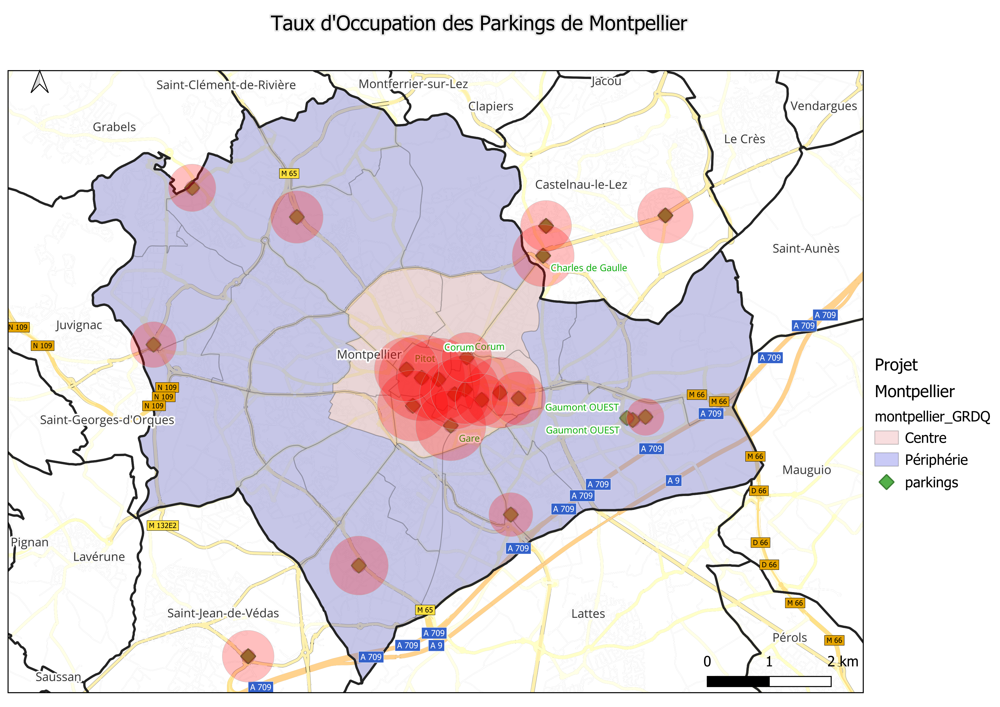


## Cartographie des Taux d'occupation des stations de vélos :

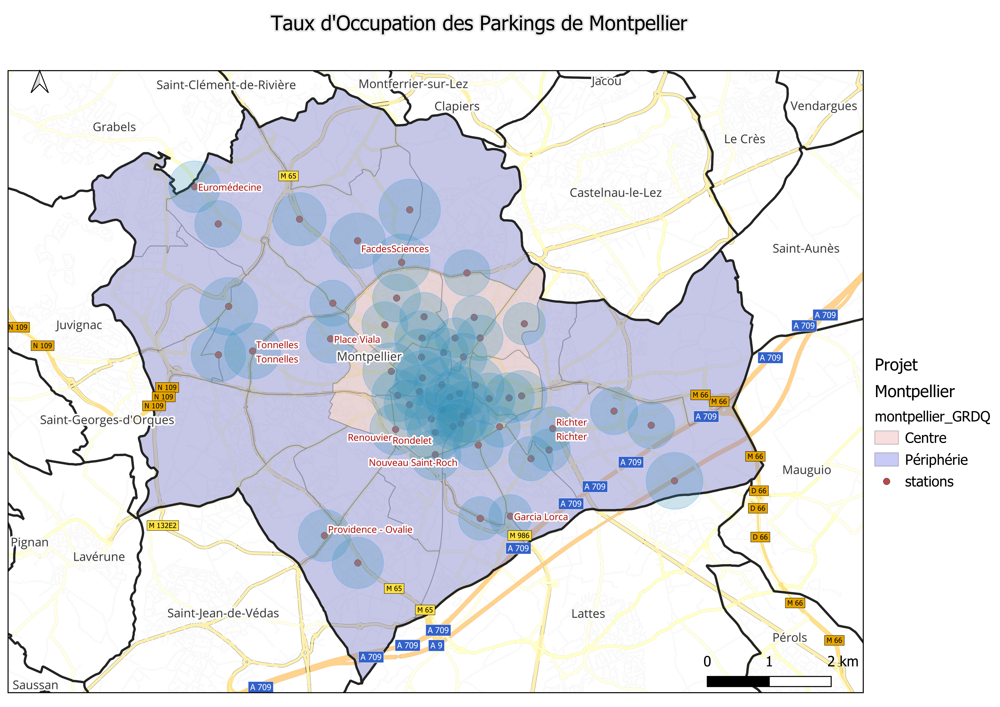


## Conclusion :<a class="anchor" id="conclusion"></a>

Les analyses effectuées montrent des besoins de parkings plus important sur le centre de Montpellier et des besoins en station de vélos plus importants en périphérie.
Toutefois créer de nouveaux parkings au centre de la commune n’est pas en cohérence avec la politique de mobilité de la ville de Montpellier.
Il est au contraire recherché des moyens d’encourager l’usage des transports en commun sur le centre de la commune et non de la voiture.
Ainsi nos recommandations développées ci-après sont en accord avec les orientations de la ville de Montpellier.

### Tarification :
Ainsi pour alléger la fréquentation des parkings du centre, il peut être envisagé d’une part d’augmenter la tarification des parkings du centre et d’autre part baisser les parkings de périphérie ou proposer une dégressivité de la tarification plus avantageuse ou encore des tarifs combinés parking + tram plus avantageux. 
 
### Développer le tram :
Le tram est un mode de transport efficace et durable qui peut contribuer à réduire la demande de stationnement. La ville de Montpellier a déjà investi dans le développement du tram, et elle devrait poursuivre ses efforts dans cette direction. Par exemple, la ville pourrait augmenter la fréquence du tram, prolonger les lignes existantes ou créer de nouvelles lignes.

### Augmenter les parkings relais :
Les parkings relais sont des parkings situés en périphérie de la ville, à proximité des transports en commun. Ils permettent aux usagers de se garer à moindre coût et de prendre les transports en commun pour se rendre en centre-ville. La ville de Montpellier dispose déjà d'un réseau de parkings relais, mais elle pourrait l'augmenter pour répondre à la demande et inciter par une augmentation de l’offre combinée à une tarification adaptée à réorienter les flux de véhicules entrant sur la commune, vers les parkings de périphérie.

### Développer les stations de  vélos :
Pour les vélos, les pistes cyclables pourraient être développées, des stations nouvelles créées principalement en périphérie nord (manque de stations constatée dans l’étude). 
Pour inciter l’usage du vélo pour les déplacements courts, les 30 premières Minutes gratuites pourrait être mis en place.


### Promouvoir les transports en commun et les vélos :
La promotion des transports en commun et des vélos est une solution qui peut contribuer à réduire la demande de stationnement. La ville de Montpellier pourrait mettre en place des campagnes de sensibilisation pour encourager les habitants à utiliser les transports en commun et les vélos. Par exemple, la ville pourrait mettre en place des tarifs attractifs pour les transports en commun, ou développer des applications mobiles qui facilitent l'utilisation des transports en commun.

#### La ville de Montpellier devrait opter pour une combinaison de ces différentes recommandations. 
#### L’analyse effectuée sur les parkings et stations de vélos a montré les points de saturation sur le territoire communal et les zones sur lesquelles la demande est très forte. Elle permet déjà d’orienter certaines décisions pour améliorer la situation au niveau du stationnement des véhicules motorisées et des stations de vélos.
#### Pour des investissements plus lourds ou plus structurant, il serait nécessaire de réaliser des études complémentaires pour mieux cerner les besoins et évaluer la complémentarité des différents moyens de transport et les reports modaux éventuels.



## Requêtes bases Parkings :<a class="anchor" id="requ_pkg"></a> 

1°) intialiser la base 

2°) faire les requêtes souhaitées 

In [5]:
# Requêtes bases Parking : 

# In[1]: init base parking :   

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import requests
pd.set_option('display.max_columns', None)    

## chargement à partir du dépôt github :
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/compil/base_parkings.xlsx"
r = requests.get(url)
#Sauvegarder le contenu téléchargé dans un fichier local:
with open('base_parkings.xlsx', 'wb') as f:
   f.write(r.content)
#Charger le fichier Excel local avec Pandas:
fic_xls = 'base_parkings.xlsx'
print(fic_xls)

# Lecture du fichier Excel
d_G = pd.read_excel(fic_xls)


base_parkings.xlsx


             nom  tx_occ  tx_penurie        zone
2      004-Corum   24.75        0.13      Centre
4       006-Foch   67.26        0.01      Centre
7   009-Triangle   46.94        0.07      Centre
8      010-Pitot   40.72        0.12      Centre
12   014-Sabines   34.37        0.04  Périphérie
tx_occ 42.81


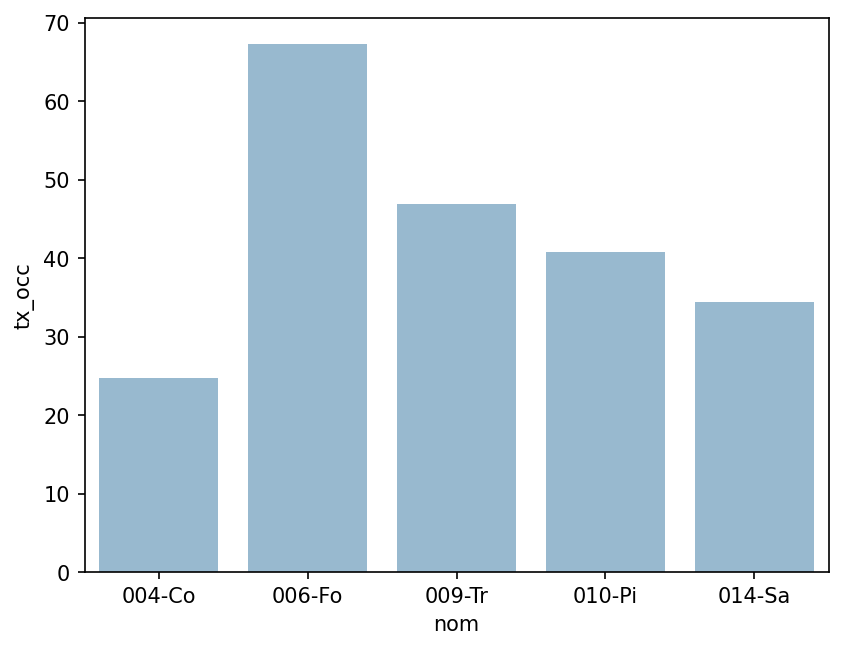

In [13]:
# In[2]: interrogation base : 

# selection des conditions de la requête : 
# exemples de requetes :
#Query =  'tx_penurie>0'
#Query =  'we_occ > 50 and tx_penurie>0'
#Query =  'we_occ > sem_occ * 0.9'
#Query =  'zone == "Centre" and tx_occ > 45'


# execution de la requête :
Query =  'tx_penurie> 0'

df= d_G.query(Query)

# affichage de la requête:
# selection des champs à afficher : 
#: 'nom', 'nuit_occ',  'jour_occ',  'soir_occ',  'sem_occ', 'we_occ', 'tx_occ', "tx_penurie', 
#'ete_occ', 'autsaison_occ', 'zone'
columns_to_show = ['nom', 'tx_occ', 'tx_penurie', 'zone']
print(df[columns_to_show])    

## nouveaux calculs sur la base : 
param='tx_occ'
print(param, round(df[param].mean(),2))

# affichage graphique du param :  
df_nom = df["nom"].str[:6]  
fig = plt.figure(dpi=150)  
sns.barplot(x=df_nom, y=param, data=df, alpha= 0.5)
# Afficher la figure
plt.show()

## Requêtes bases Velo :<a class="anchor" id="requ_velo"></a>


1°) intialiser la base

2°) faire les requêtes souhaitées

In [7]:
# Requêtes bases Velo :

# In[1]: init base velo :
    
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import requests
pd.set_option('display.max_columns', None)    

## chargement à partir du dépôt github :
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/compil/base_velos.xlsx"

r = requests.get(url)
#Sauvegarder le contenu téléchargé dans un fichier local:
with open('base_velos.xlsx', 'wb') as f:
   f.write(r.content)
#Charger le fichier Excel local avec Pandas:
fic_xls2 = 'base_velos.xlsx'

print(fic_xls2)

# Lecture du fichier Excel
d_V = pd.read_excel(fic_xls2)
    

base_velos.xlsx


                                     nom  jour_occ  soir_occ        zone
31                         034-Vert Bois     78.81     89.44  Périphérie
34                    037-FacdesSciences     62.56     79.23  Périphérie
35                    038-Fac de Lettres     66.71     80.32  Périphérie
45              048-Hôtel du Département     71.32     76.49  Périphérie
48  051-Pont de Lattes - Gare Saint-Roch     82.54     80.44      Centre
54                     059-Sud De France     68.79     70.12  Périphérie
tx_occ 75.02


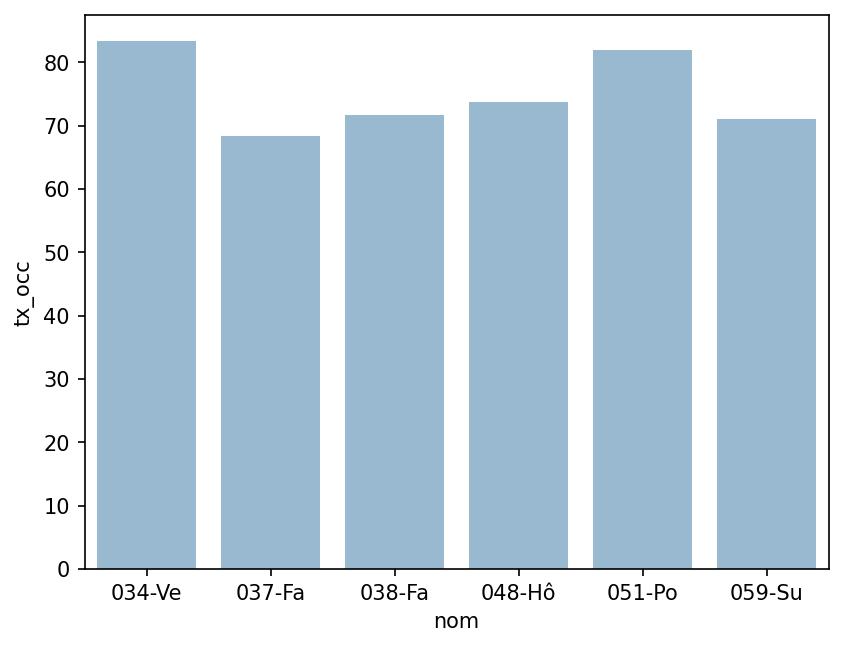

In [14]:
# In[2]: interrogation base : 

# selection des conditions de la requête : 
#Query =  'tx_penurie>0'
#Query =  'we_occ > 50 and tx_penurie>0'
#Query =  'we_occ > sem_occ * 0.9'
#Query =  'zone == "Centre" and tx_occ > 70'
#Query =  'soir_occ >jour_occ'
# execution de la requête :
Query =  'tx_penurie>20'
df= d_V.query(Query)

# affichage de la requête:
# selection des champs à afficher : 
#: 'nom', 'nuit_occ',  'jour_occ',  'soir_occ',  'sem_occ', 'we_occ', 'tx_occ', "tx_penurie', 
#'ete_occ', 'autsaison_occ', 'zone'
columns_to_show = ['nom', 'jour_occ',  'soir_occ', 'zone']
print(df[columns_to_show])    

## nouveaux calculs sur la base : 
param='tx_occ'
print(param, round(df[param].mean(),2))

# affichage graphique du param :  
df_nom = df["nom"].str[:6] 

fig = plt.figure(dpi=150)  
sns.barplot(x=df_nom , y=param, data=df, alpha= 0.5)
# Afficher la figure
plt.show()

## Affichage détaillé stats parkings :<a class="anchor" id="stats_pkg"></a>

Indiquer le code velo à étudier (ex. '001')

Indiquer le niveau d'analyse ('heure', 'jour', 'mois')



base_parkings.xlsx
data_f_001-Antigone.csv


,jour,jours,nb_data,min,max,mean,std,sum,Q1,median,Q3,taux_dispo,taux_occ,penurie,taux_penurie
0,0,Mon,10041,76.0,166.0,122.1,23.8,1225917.0,99.0,125.0,144.0,51.08,48.92,0,0.00000
1,1,Tues,9718,68.0,159.0,118.0,23.7,1146818.0,98.0,115.0,140.0,49.38,50.62,0,0.00000
2,2,Wed,10069,80.0,163.0,118.3,22.5,1190669.0,98.0,112.0,141.0,49.48,50.52,0,0.00000
3,3,Thur,10306,49.0,165.0,118.0,24.4,1216097.0,98.0,112.0,141.0,49.37,50.63,0,0.00000
4,4,Fri,10847,60.0,166.0,118.4,23.3,1283952.0,98.0,113.0,140.0,49.53,50.47,0,0.00000
5,5,Sat,10718,0.0,164.0,121.0,25.2,1296819.0,101.0,125.0,143.0,50.63,49.37,3,0.02799
6,6,Sun,10336,44.0,167.0,128.2,23.4,1325085.0,106.0,134.0,150.0,53.64,46.36,0,0.00000


mean_001-Antigone.png


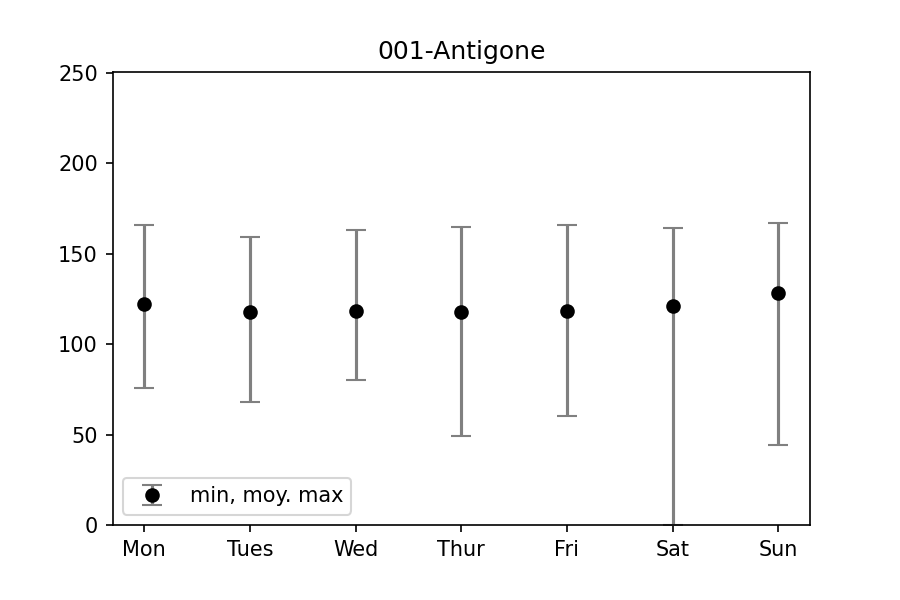

median_001-Antigone.png


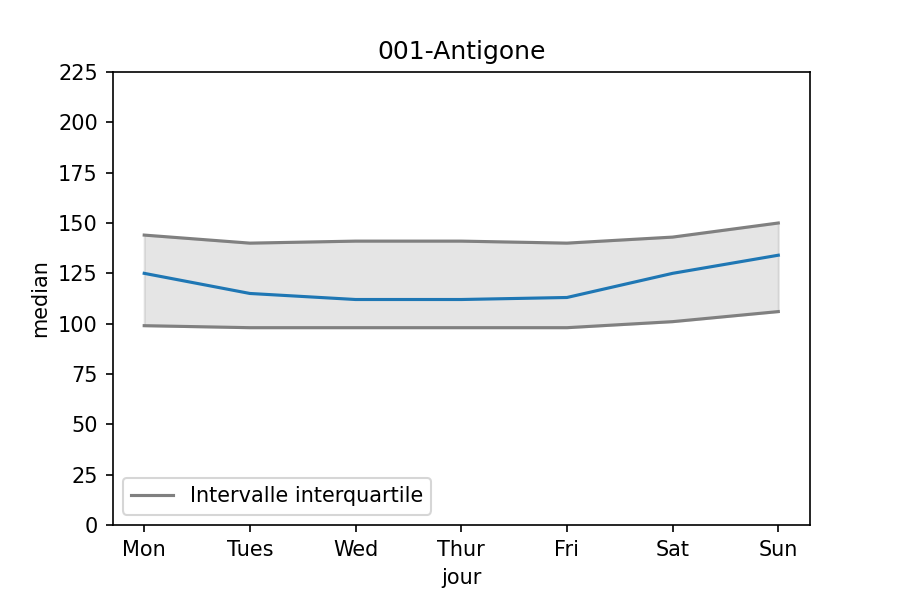

T_Dispo_001-Antigone.png


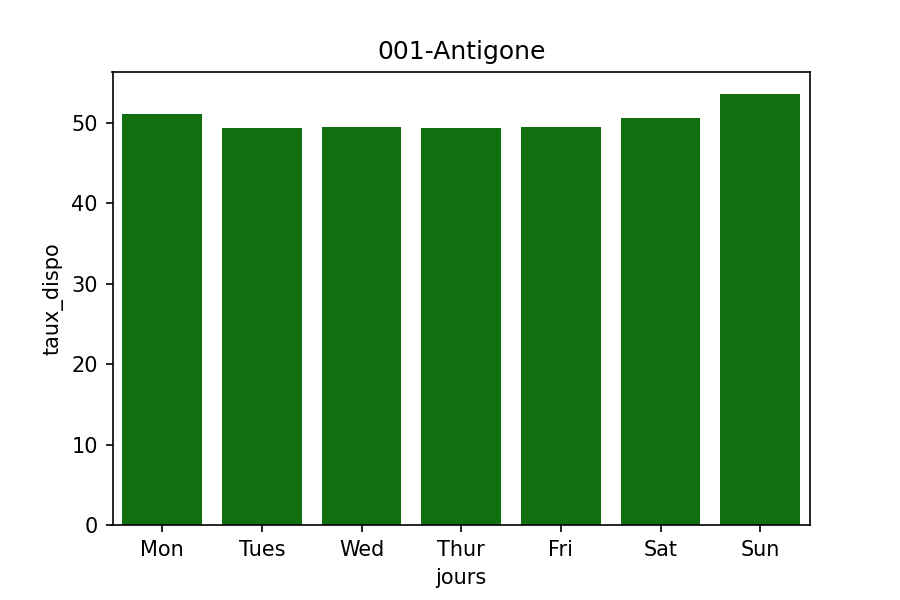

T_Occup_001-Antigone.png


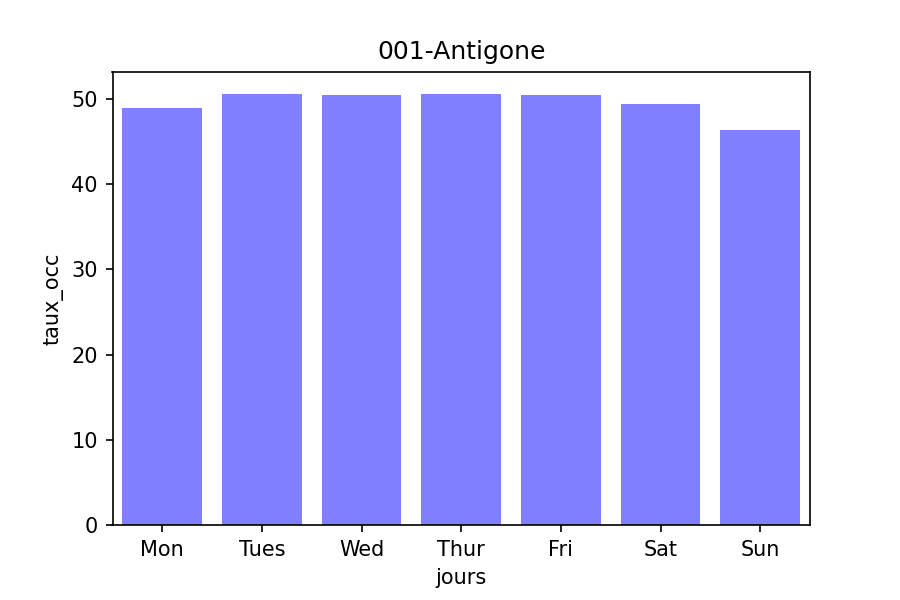

T_Penurie_001-Antigone.png


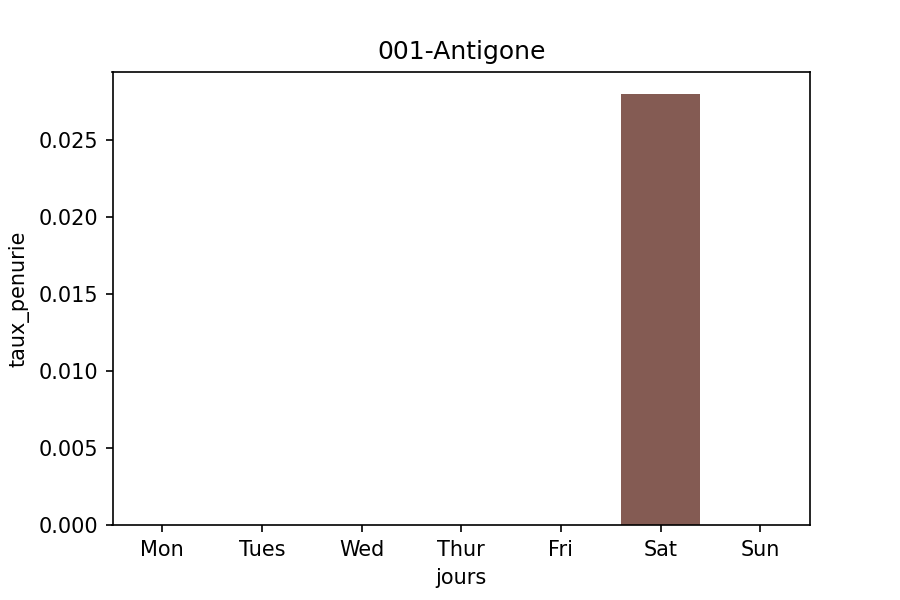

In [34]:
### code du pkg à afficher

id_P ='001'

# données par : 'heure', 'jour', 'mois' !
segment ='jour'

### nom du pkg  :
import pandas as pd
import requests
import IPython.display
from PIL import Image

import io

pd.set_option('display.max_columns', None) 

## chargement à partir du dépôt github :
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/compil/base_parkings.xlsx"
r = requests.get(url)
#Sauvegarder le contenu téléchargé dans un fichier local:
with open('base_parkings.xlsx', 'wb') as f:
   f.write(r.content)
#Charger le fichier Excel local avec Pandas:
fic_xls = 'base_parkings.xlsx'

print(fic_xls)

# Lecture du fichier Excel
d_G = pd.read_excel(fic_xls)
d_G['code']= d_G['nom'].str[:3]
#nom_P = d_G.loc[d_G['code'].isin([id_P]), 'nom']
nom_P = d_G.loc[d_G['code'].isin([id_P]), 'nom'].values[0] 
nom_P= str(nom_P)    

## chargement bdd depuis github:
#"data_f_001-Antigone.csv"
fic = "data_f_"+nom_P+'.csv'
print(fic)

fic="data_f_001-Antigone.csv"
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

#Sauvegarder le contenu téléchargé dans un fichier local:
with open('baseP.csv', 'wb') as f:
   f.write(r.content)

#Charger le fichier Excel local avec Pandas:
fic_csv = 'baseP.csv'

# Conversion du fichier en objet DataFrame
d_P = pd.read_csv(fic_csv, sep=';')
   
# Affichage du fichier
IPython.display.display(d_P)



## chargement graphiques à partir du dépôt github :
fic = "mean_"+nom_P+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)


## chargement graphiques à partir du dépôt github :
fic = "median_"+nom_P+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)

## chargement graphiques à partir du dépôt github :
fic = "T_Dispo_"+nom_P+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 

# Affichage de l'image 
IPython.display.display(image)


## chargement graphiques à partir du dépôt github :
fic = "T_Occup_"+nom_P+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)

## chargement graphiques à partir du dépôt github :
fic = "T_Penurie_"+nom_P+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)


## Affichage détaillé stats stations :<a class="anchor" id="stats_velo"></a>

Indiquer le code parking à étudier (ex. '001')

Indiquer le niveau d'analyse ('heure', 'jour', 'mois')

base_velos.xlsx
data_f_005-Corum.csv


,Mois,nb_data,min,max,mean,std,sum,Q1,median,Q3,taux_dispo,taux_occ,penurie,taux_penurie
0,Janv,38212,0.0,12.0,6.0,3.5,229802.0,3.0,6.0,9.0,50.12,49.88,2138,5.595101
1,Fev,40314,0.0,12.0,6.1,3.8,244020.0,3.0,6.0,10.0,50.44,49.56,2734,6.781763
2,Mars,20928,0.0,12.0,6.6,3.6,138174.0,4.0,6.0,10.0,55.02,44.98,989,4.725726
3,Avril,4729,0.0,11.0,5.5,4.1,26046.0,1.0,6.0,10.0,45.90,54.10,260,5.497991
4,Mai,40348,0.0,12.0,4.7,3.2,187942.0,2.0,4.0,7.0,38.82,61.18,2590,6.419153
5,Juin,17094,0.0,12.0,4.9,3.8,84473.0,1.0,4.0,8.0,41.18,58.82,1715,10.032760
6,Juil,28163,1.0,12.0,7.4,2.9,207626.0,5.0,8.0,10.0,61.44,38.56,0,0.000000
7,Aout,39377,0.0,12.0,5.2,2.9,204783.0,3.0,5.0,7.0,43.34,56.66,880,2.234807
8,Sept,5239,0.0,9.0,3.5,2.0,18474.0,2.0,3.0,5.0,29.39,70.61,349,6.661577
9,Oct,26796,0.0,12.0,7.6,3.3,203061.0,5.0,8.0,11.0,63.15,36.85,132,0.492611


mean_005-Corum.png


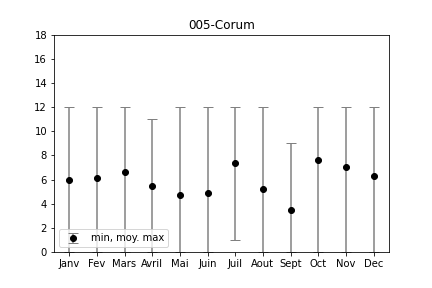

median_005-Corum.png


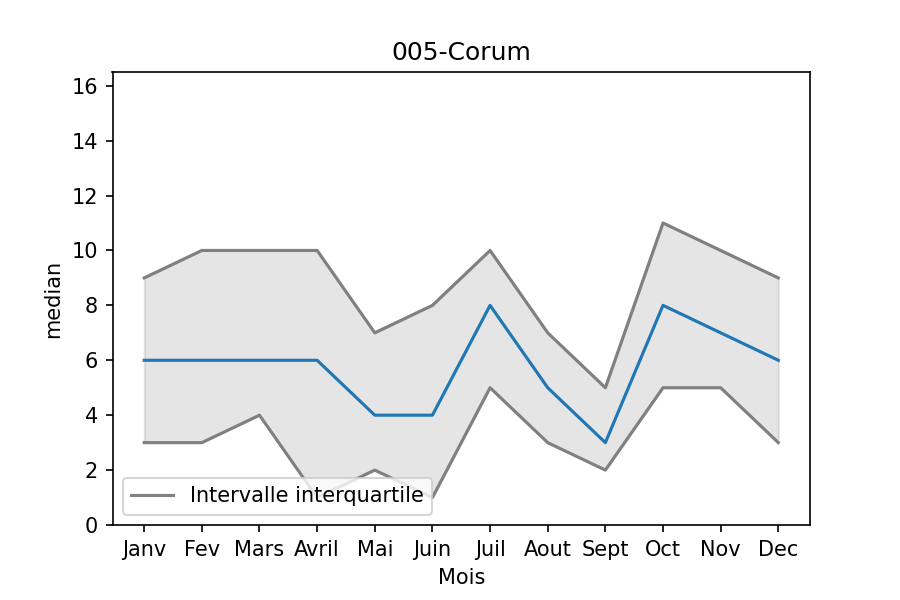

T_Dispo_005-Corum.png


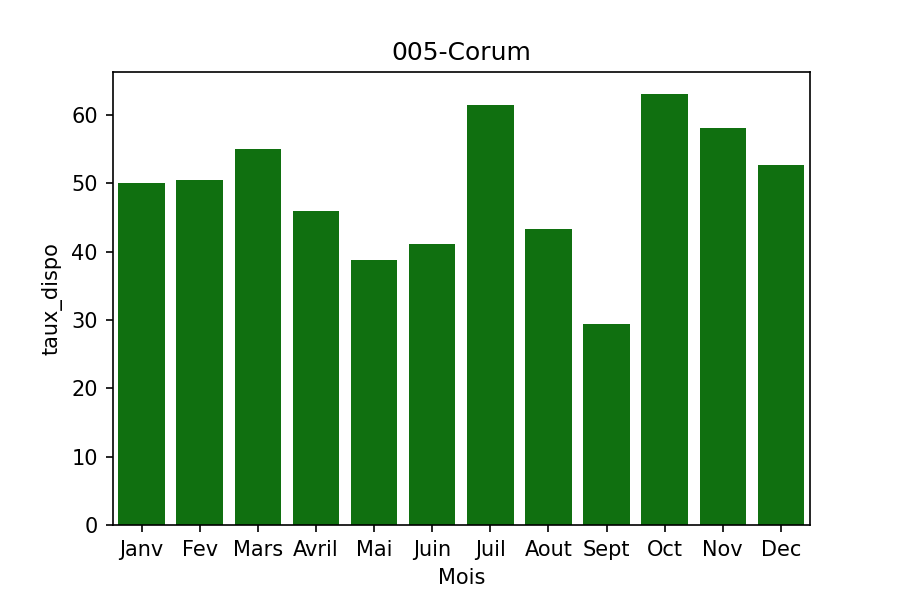

T_Occup_005-Corum.png


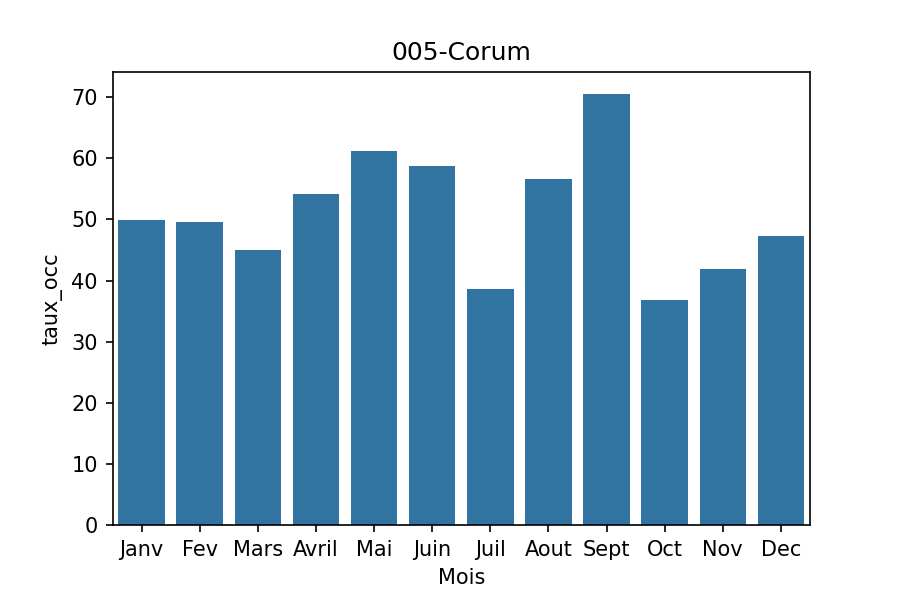

T_Penurie_005-Corum.png


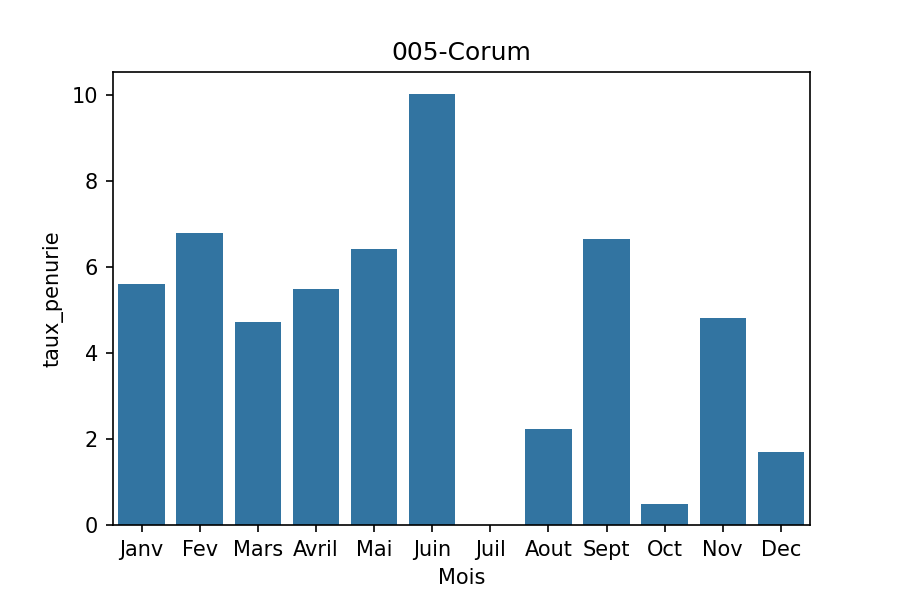

In [33]:

### code de la station de velo à afficher

id_V ='005'

# données par : 'heure', 'jour', 'mois' !
segment ='mois'

### nom du pkg  :
import pandas as pd
import requests
import IPython.display
from PIL import Image
import io

pd.set_option('display.max_columns', None) 

## chargement à partir du dépôt github :
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/parking/compil/base_velos.xlsx"
r = requests.get(url)
#Sauvegarder le contenu téléchargé dans un fichier local:
with open('base_velos.xlsx', 'wb') as f:
   f.write(r.content)
#Charger le fichier Excel local avec Pandas:
fic_xls = 'base_velos.xlsx'

print(fic_xls)

# Lecture du fichier Excel
d_V = pd.read_excel(fic_xls)
d_V['code']= d_V['nom'].str[:3]
nom_V = d_V.loc[d_V['code'].isin([id_V]), 'nom'].values[0] 
nom_V= str(nom_V)    

## chargement bdd depuis github:

fic = "data_f_"+nom_V+'.csv'
print(fic)

url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/velo/"
url2 = ''
url2 = url + segment+"/"+ str(fic)

r = requests.get(url2)

#Sauvegarder le contenu téléchargé dans un fichier local:
with open('baseV.csv', 'wb') as f:
   f.write(r.content)

#Charger le fichier Excel local avec Pandas:
fic_csv = 'baseV.csv'

# Conversion du fichier en objet DataFrame
d_E = pd.read_csv(fic_csv, sep=';')
   
# Affichage du fichier
IPython.display.display(d_E)


## chargement graphiques à partir du dépôt github :
fic = "mean_"+nom_V+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/velo/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)


## chargement graphiques à partir du dépôt github :
fic = "median_"+nom_V+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/velo/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)

## chargement graphiques à partir du dépôt github :
fic = "T_Dispo_"+nom_V+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/velo/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)


## chargement graphiques à partir du dépôt github :
fic = "T_Occup_"+nom_V+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/velo/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)

## chargement graphiques à partir du dépôt github :
fic = "T_Penurie_"+nom_V+'.png'
print(fic)
url = "https://github.com/MathisP-afk/MathisP-afk/raw/main/parkings/Data_frame/velo/"
url2 = ''
url2 = url + segment+"/"+ str(fic)
r = requests.get(url2)

# Affichage de l'image dans la console IPython
# Conversion de l'image en objet PIL
# Converti en RGB
image = Image.open(io.BytesIO(r.content)).convert('RGB') 
# Affichage de l'image 
IPython.display.display(image)